# Metrical HMM Belief Geometry

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/mvonebers/metrical-hmm/blob/main/notebooks/dimeter.ipynb)

In [ ]:
# Setup for Google Colab
import sys
if 'google.colab' in sys.modules:
    !git clone https://github.com/mvonebers/metrical-hmm.git
    %cd metrical-hmm
    !pip install -e . -q

In [ ]:
import plotly.io as pio
import sys
pio.renderers.default = "colab" if "google.colab" in sys.modules else "notebook"

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML

from metrical_hmm import MetricalHMM, BinaryEmission, STATE_NAMES
from metrical_hmm.visualization import (
    plot_belief_trajectory_interactive,
    plot_multiple_trajectories_interactive,
    create_animation,
)

%matplotlib inline
plt.style.use('seaborn-v0_8-whitegrid')

## HMM Setup

In [3]:
emission = BinaryEmission(clarity=0.85)
hmm = MetricalHMM(emission_model=emission, strictness=0.9, allow_skips=True, line_reset_prob=0.9)

print(hmm)
print(f"\nTransition matrix:\n{hmm.A.round(3)}")
print(f"\nEmission matrix:\n{hmm.B.round(3)}")

MetricalHMM(strictness=0.90, allow_skips=True, line_reset_prob=0.90)

Transition matrix:
[[0.033 0.9   0.033 0.033]
 [0.033 0.033 0.9   0.033]
 [0.033 0.033 0.033 0.9  ]
 [0.9   0.033 0.033 0.033]]

Emission matrix:
[[0.85 0.15]
 [0.15 0.85]
 [0.85 0.15]
 [0.15 0.85]]


## Generate Sequence

In [4]:
np.random.seed(42)
states, observations = hmm.sample(80, seed=42)

obs_names = ['u', 'S']
obs_str = [obs_names[o] for o in observations]

print("Generated sequence (u=unstressed, S=stressed):")
for i in range(0, min(32, len(obs_str)), 4):
    line = ' '.join(obs_str[i:i+4])
    state_line = ' '.join([STATE_NAMES[s] for s in states[i:i+4]])
    print(f"Line {i//4 + 1:2d}: {line}  |  {state_line}")

Generated sequence (u=unstressed, S=stressed):
Line  1: u S S S  |  W1 S1 W2 S2
Line  2: u S u S  |  W1 S1 W2 S2
Line  3: u S u S  |  W1 S1 W2 S2
Line  4: u u u S  |  W1 S1 W2 S2
Line  5: u S u S  |  W1 S1 W2 S2
Line  6: u S u S  |  W1 S1 W2 S2
Line  7: u u u S  |  W1 S1 W2 S2
Line  8: u u u S  |  W1 S1 W2 S2


## Belief Trajectory on Simplex

In [5]:
beliefs = hmm.forward(observations)

print(f"Belief shape: {beliefs.shape}")
print(f"\nFirst 8 belief states:")
print("t  | P(W1)  P(S1)  P(W2)  P(S2) | obs")
print("-" * 45)
for t in range(8):
    b = beliefs[t]
    print(f"{t:2d} | {b[0]:.3f}  {b[1]:.3f}  {b[2]:.3f}  {b[3]:.3f} |  {obs_names[observations[t]]}")

Belief shape: (80, 4)

First 8 belief states:
t  | P(W1)  P(S1)  P(W2)  P(S2) | obs
---------------------------------------------
 0 | 0.926  0.010  0.054  0.010 |  u
 1 | 0.008  0.898  0.008  0.086 |  S
 2 | 0.079  0.166  0.590  0.166 |  S
 3 | 0.044  0.143  0.044  0.769 |  S
 4 | 0.793  0.014  0.179  0.014 |  u
 5 | 0.009  0.779  0.009  0.203 |  S
 6 | 0.225  0.008  0.760  0.008 |  u
 7 | 0.008  0.244  0.008  0.741 |  S


In [6]:
fig = plot_belief_trajectory_interactive(beliefs, title="Belief Trajectory on 3-Simplex")
fig.show()

## Attractor Structure (Multiple Trajectories)

In [7]:
n_trajectories = 10
belief_list = []

for i in range(n_trajectories):
    _, obs = hmm.sample(80, seed=i)
    belief_list.append(hmm.forward(obs))

fig = plot_multiple_trajectories_interactive(
    belief_list, 
    title=f"Attractor Structure ({n_trajectories} trajectories)"
)
fig.show()

## 5. Animation

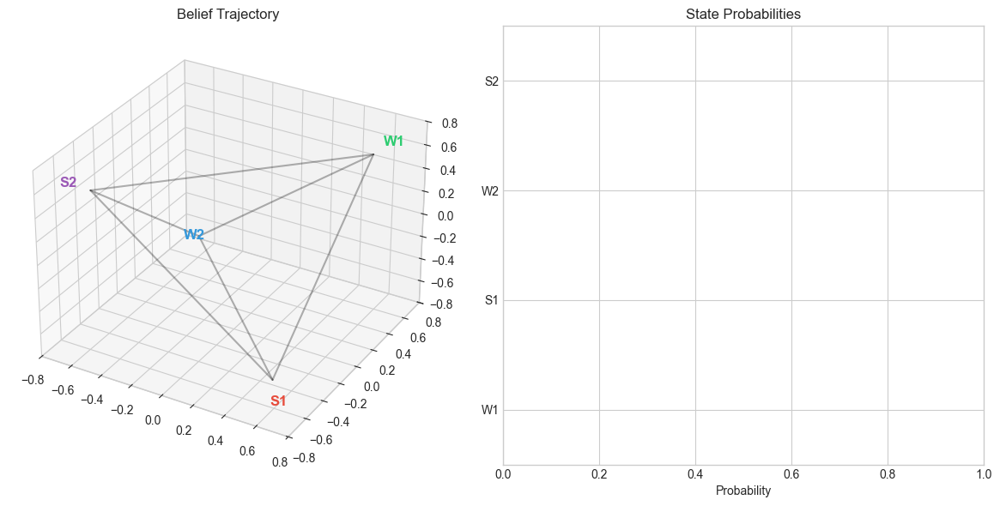

In [8]:
states, obs = hmm.sample(60, seed=42)
beliefs = hmm.forward(obs)
anim = create_animation(beliefs, obs, hmm.emission_model, interval=150)
HTML(anim.to_jshtml())